In [1]:
using Plots, LaTeXStrings
include("solar_insolation.jl");
using .SolarInsolationModel

In [2]:
# Plot Settings
plot_font = "Computer Modern"
default(
    fontfamily=plot_font,
    linewidth=2
)

# Parameters

In [3]:
# Vehicle Parameters
Base.@kwdef struct ASV_Params
    b_max::Float32 = 6500; # max soc in Wh
    b_min::Float32 = 0; # min soc in Wh
    panel_area::Float32 = 4; # m^2
    panel_efficiency::Float32 = 0.25; # 25% panel efficiency
    v_max::Float32 = 2.315; # max boat speed in m/s 
    v_min::Float32 = 0; # min boat speed in m/s

    k_h::Float32 = 10; # Hotel Load
    k_m::Float32 = 83; # Motor multiplier, need to tune
end

boat = ASV_Params();

# Environment Parameters
# dayOfYear = 180;
dayOfYear = 180;
lat = 35.0; # degrees
Δt = 0.1; # time step in hours
t = 0:Δt:24;
og_time = t;
t = t .+ 12;
t = t .% 24; # time over a day from noon to noon
n = length(t);

# Initial Conditions
b_0 = boat.b_max/2;

# Solar Irradiance

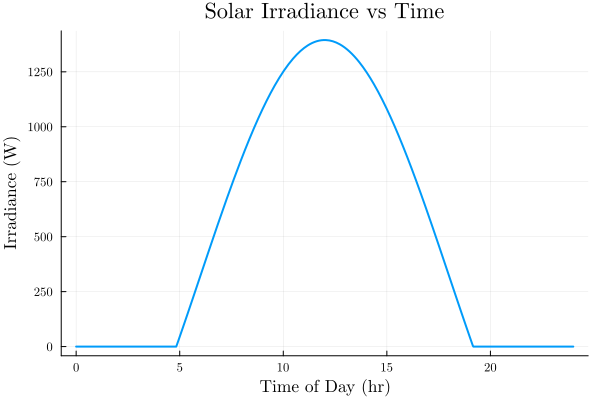

In [4]:
plot(solarTime -> max(0,SolarInsolation(dayOfYear, solarTime, lat))*1000, 0, 24);
xlabel!("Time of Day (hr)");
ylabel!("Irradiance (W)");
title!("Solar Irradiance vs Time");
plot!(legend=false)

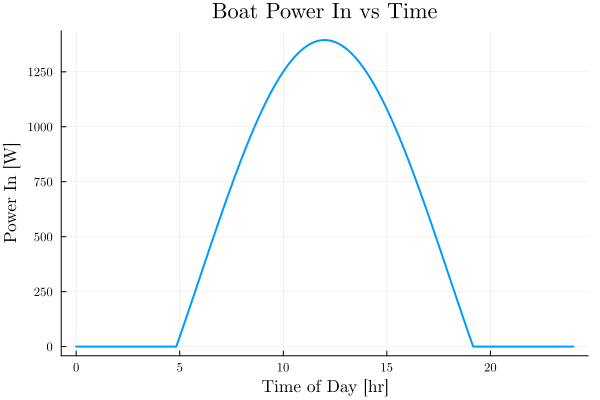

In [5]:
plot(solarTime -> max(0,SolarInsolation(dayOfYear, solarTime, lat))*1000*boat.panel_area*boat.panel_efficiency, 0, 24);
xlabel!("Time of Day [hr]");
ylabel!("Power In [W]");
title!("Boat Power In vs Time");
plot!(legend=false)

# Lower Barrier
We can first compute an "energy deficit curve" across the mission horizon

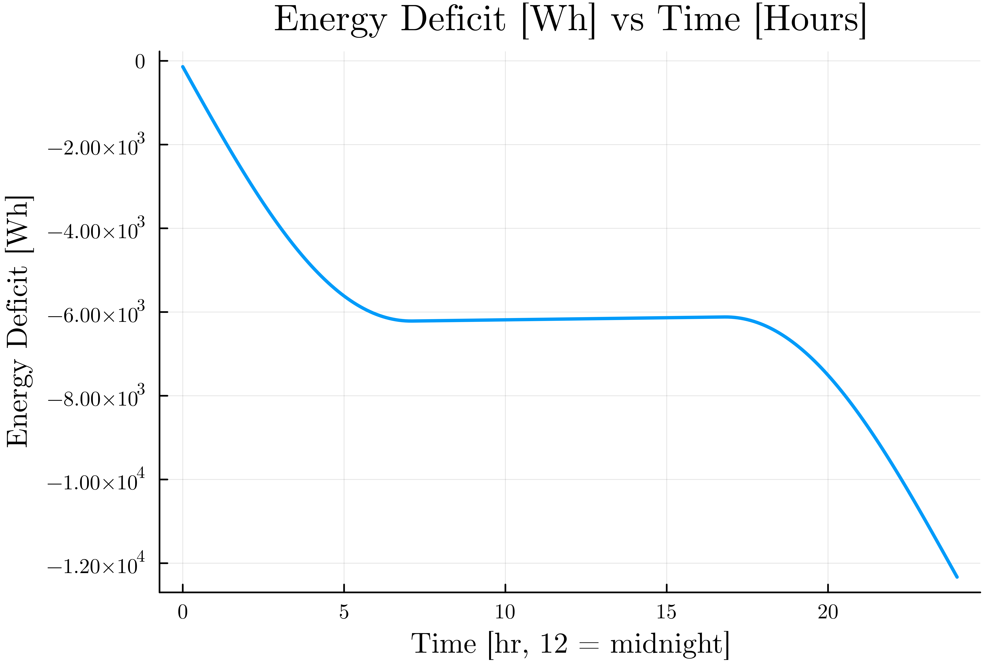

In [6]:
ϵ₋ = zeros(n); # energy deficit
Ps = zeros(n);
for i = 1:n
    Ps[i] = max(0, SolarInsolation(dayOfYear, t[i], lat))*1000* boat.panel_area * boat.panel_efficiency;
    ϵ₋[i] = boat.k_h*(og_time[i] - og_time[1]) - sum(Ps[1:i]*Δt);
end

plot(og_time, ϵ₋, lw=2);
xlabel!("Time [hr, 12 = midnight]");
ylabel!("Energy Deficit [Wh]");
title!("Energy Deficit [Wh] vs Time [Hours]");
plot!(legend=false, dpi=900)
savefig("fig/energydeficit.png")
plot!()

At each time $t_1 \in [t_0, t_f]$, we shift the energy deficit curve such that $\epsilon_{-}(t_1) = 0$. We define this as
$$
\epsilon_{-}^{\dagger}(t) = \epsilon_{-}(t) - \epsilon_{-}(t_1) \text{ where } t = [t_0, t_f] \text{ and } \forall t_1 \in [t_0, t_f]
$$
Then, we define the lower barrier function $h_l$:
$$
\begin{align*}
h_{temp} &= \max_{t_2 \in [t_1, t_f]} \epsilon_{-}^{\dagger}(t_2)\\
h_{l}(t_1) &= \begin{cases}
h_{temp} & h_{temp} > 0\\
0 & else
\end{cases}
\end{align*}
$$

┌ Info: Saved animation to c:\Users\kavin\Documents\Research\CPS\characterizing-ive\lower_epsAdjust.gif
└ @ Plots C:\Users\kavin\.julia\packages\Plots\Ec1L1\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\kavin\\Documents\\Research\\CPS\\characterizing-ive\\lower_epsAdjust.gif")
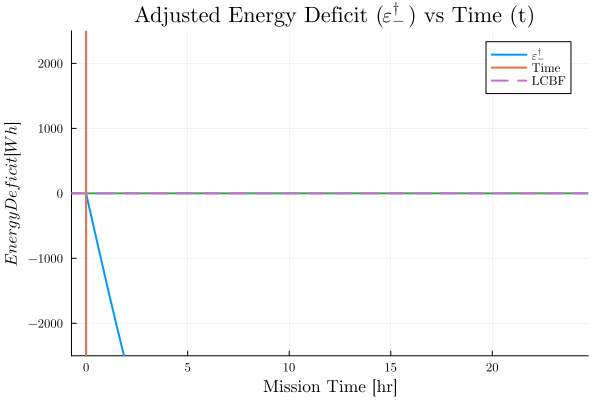

In [7]:
epsAdjust = @animate for i = 1:n
    # Compute Adjusted Energy Deficit curve
    ϵ₋dag = ϵ₋ .- ϵ₋[i];
    lcbf = max(0, maximum(ϵ₋dag[i:end]));

    # Plot
    plot(og_time, ϵ₋dag, label=L"$\epsilon_{-}^{\dagger}$");
    ylims!(-2500, 2500);
    vline!([og_time[i]], label="Time");
    hline!([0], label=false);
    hline!([lcbf], linestyle=:dash, label="LCBF");
    xlabel!("Mission Time [hr]");
    ylabel!(L"Energy Deficit [Wh]");
    title!(L" Adjusted Energy Deficit ($\epsilon_{-}^{\dagger}$) vs Time (t)");
    plot!()
end
gif(epsAdjust, "lower_epsAdjust.gif")

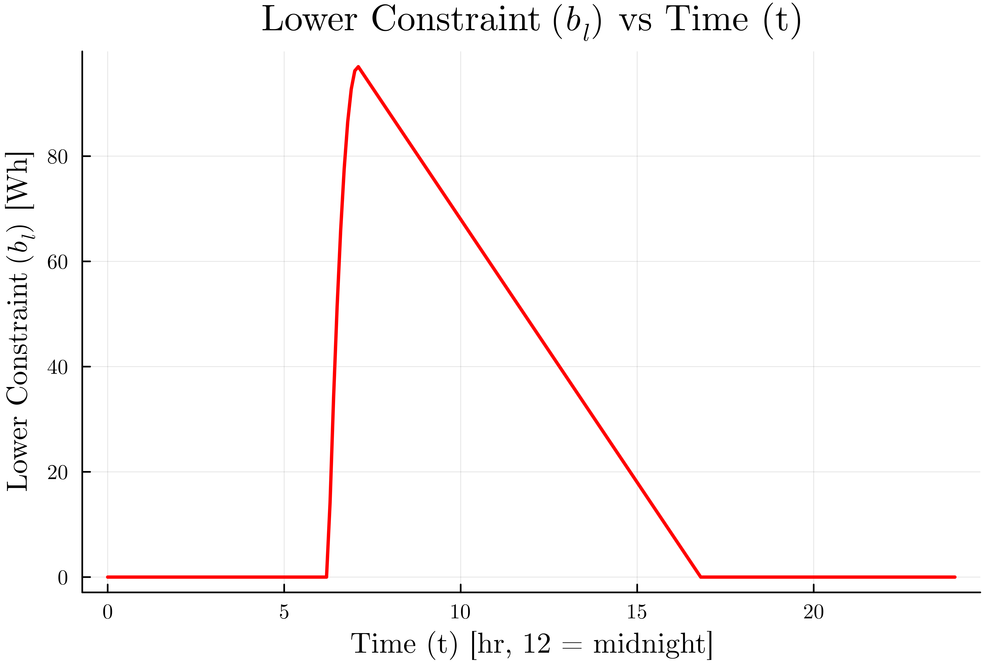

In [8]:
lcbf = zeros(n);

for i = 1:n
    ϵ₋dag = ϵ₋ .- ϵ₋[i];
    lcbf[i] = max(0, maximum(ϵ₋dag[i:end]));
end
plot(og_time, lcbf, linecolor = "red");
xlabel!("Time (t) [hr, 12 = midnight]");
ylabel!(L"Lower Constraint $(b_l)$ [Wh]");
title!(L"Lower Constraint $(b_l)$ vs Time (t)");
plot!(legend=false, dpi=900)
savefig("fig/lowercbf.png");
plot!()

# Lower CBF Rate of Change

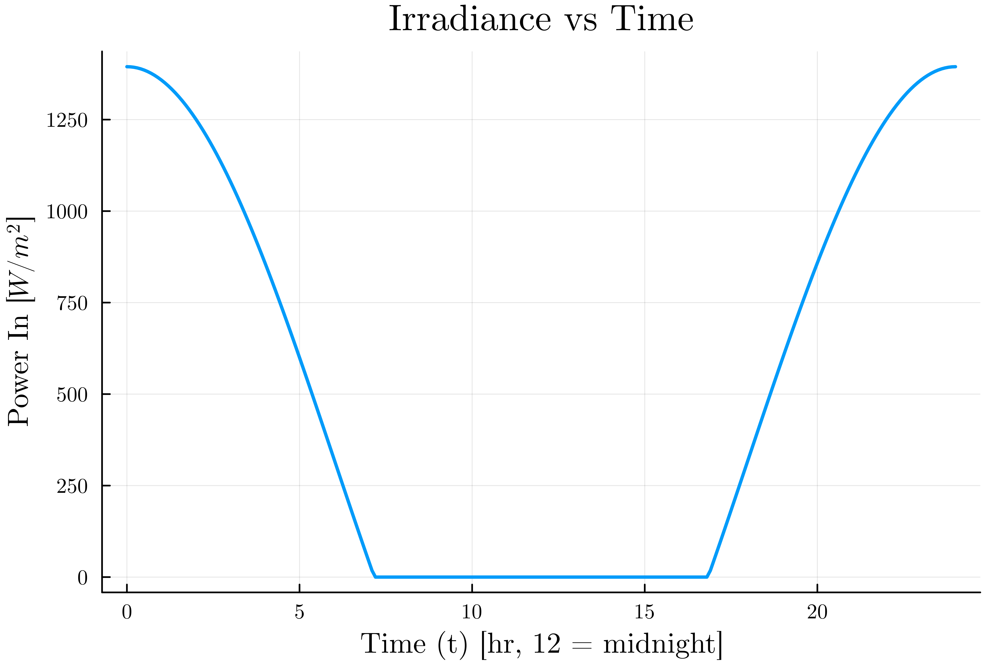

In [9]:
bdot_zerovel = zeros(n);
for i = 1:n
    bdot_zerovel[i] = max(0,SolarInsolation(dayOfYear, t[i], lat))*1000*boat.panel_area*boat.panel_efficiency;
end
plot(og_time, bdot_zerovel);
xlabel!("Time (t) [hr, 12 = midnight]");
ylabel!(L"Power In [$W/m^2$]");
title!("Irradiance vs Time")
plot!(legend=false, dpi=900)
savefig("fig/irradiance_in_one_day.png")
plot!()

# Upper Barrier
We compute the additional energy by
$$
\epsilon_{+}(t) = P_s(t) - k_h - k_m u^3(t)
$$

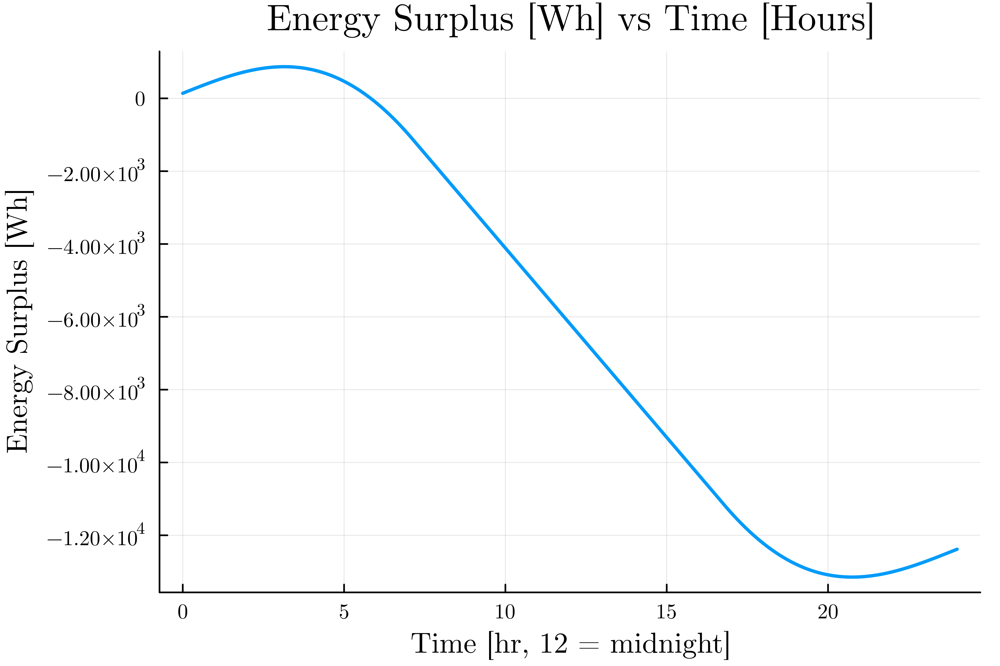

In [10]:
ϵ₊ = zeros(n); # energy surplus
Ps = zeros(n);
for i = 1:n
    Ps[i] = max(0, SolarInsolation(dayOfYear, t[i], lat))*1000* boat.panel_area * boat.panel_efficiency;
    # boat.k_h*(og_time[i] - og_time[1])
    ϵ₊[i] = sum(Ps[1:i]*Δt) - (boat.k_h + boat.k_m*(boat.v_max^3))*(og_time[i] - og_time[1]);
end

plot(og_time, ϵ₊, lw = 2);
xlabel!("Time [hr, 12 = midnight]");
ylabel!("Energy Surplus [Wh]");
title!("Energy Surplus [Wh] vs Time [Hours]");
plot!(legend=false, dpi=900)
savefig("fig/energysurplus.png")
plot!()

At each time $t_1 \in [t_0, t_f]$, we shift the energy surplus curve such that $\epsilon_{+}(t_1) = 0$. We define this as
$$
\epsilon_{+}^{\dagger}(t) = \epsilon_{+}(t) - \epsilon_{+}(t_1) \text{ where } t = [t_0, t_f] \text{ and } \forall t_1 \in [t_0, t_f]
$$
Then, we define the upper barrier function $h_u$:
$$
\begin{align*}
h_{temp} &= \max_{t_2 \in [t_1, t_f]} \epsilon_{+}^{\dagger}(t_2)\\
h_{u}(t_1) &= \begin{cases}
h_{temp} & h_{temp} > b_{max}\\
b_{max} & else
\end{cases}
\end{align*}
$$

┌ Info: Saved animation to c:\Users\kavin\Documents\Research\CPS\characterizing-ive\upper_epsAdjust.gif
└ @ Plots C:\Users\kavin\.julia\packages\Plots\Ec1L1\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\kavin\\Documents\\Research\\CPS\\characterizing-ive\\upper_epsAdjust.gif")
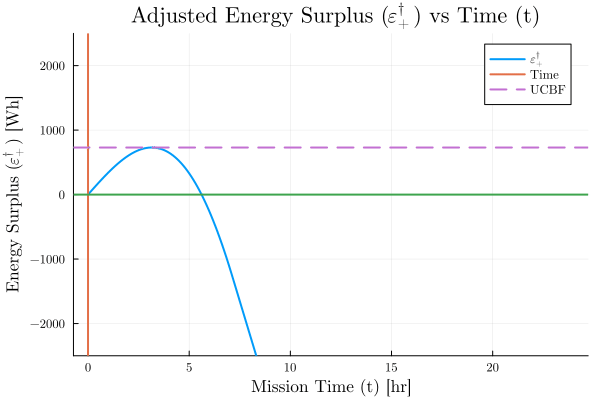

In [11]:
epsAdjust = @animate for i = 1:n
    # Compute Adjusted Energy Deficit curve
    ϵ₊dag = ϵ₊ .- ϵ₊[i];
    ucbf = max(0, maximum(ϵ₊dag[i:end]));

    # Plot
    plot(og_time, ϵ₊dag, label=L"$\epsilon_{+}^{\dagger}$");
    ylims!(-2500, 2500);
    vline!([og_time[i]], label="Time");
    hline!([0], label=false);
    hline!([ucbf], linestyle=:dash, label="UCBF");
    xlabel!("Mission Time (t) [hr]");
    ylabel!(L"Energy Surplus ($\epsilon_{+}^{\dagger}$) [Wh]");
    title!(L" Adjusted Energy Surplus ($\epsilon_{+}^{\dagger}$) vs Time (t)");
    plot!()
end
gif(epsAdjust, "upper_epsAdjust.gif")

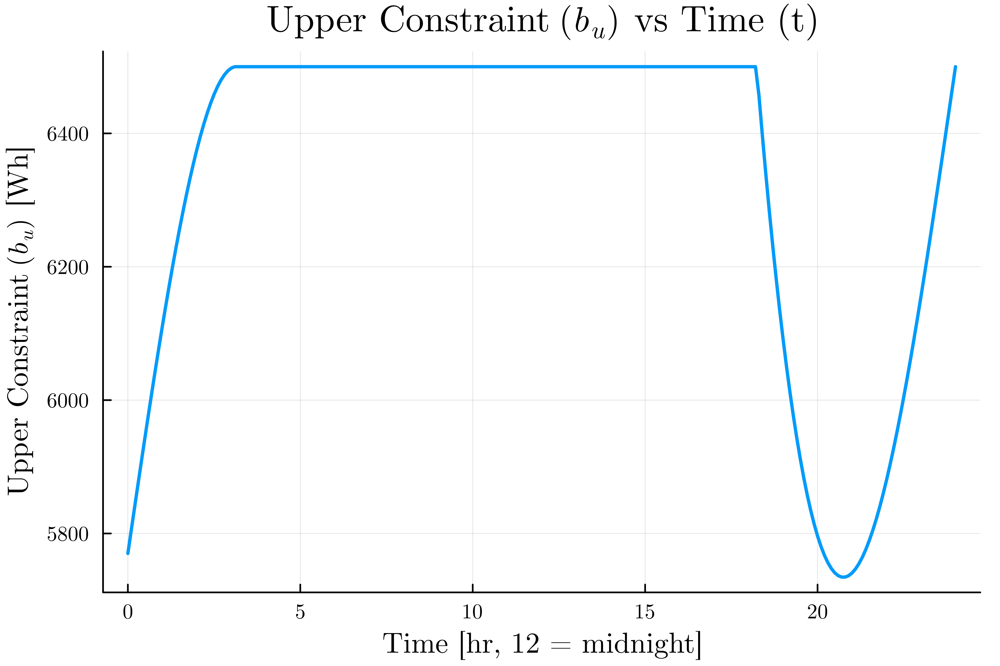

In [12]:
ucbf = zeros(n);

for i = 1:n
    ϵ₊dag = ϵ₊ .- ϵ₊[i];
    ucbf[i] = boat.b_max - max(0, maximum(ϵ₊dag[i:end]));
end
plot(og_time, ucbf);
xlabel!("Time [hr, 12 = midnight]");
ylabel!(L"Upper Constraint $(b_u)$ [Wh]");
title!(L"Upper Constraint $(b_u)$ vs Time (t)");
plot!(legend=false, dpi=900)
savefig("fig/uppercbf.png");
plot!()

# Combined Barrier

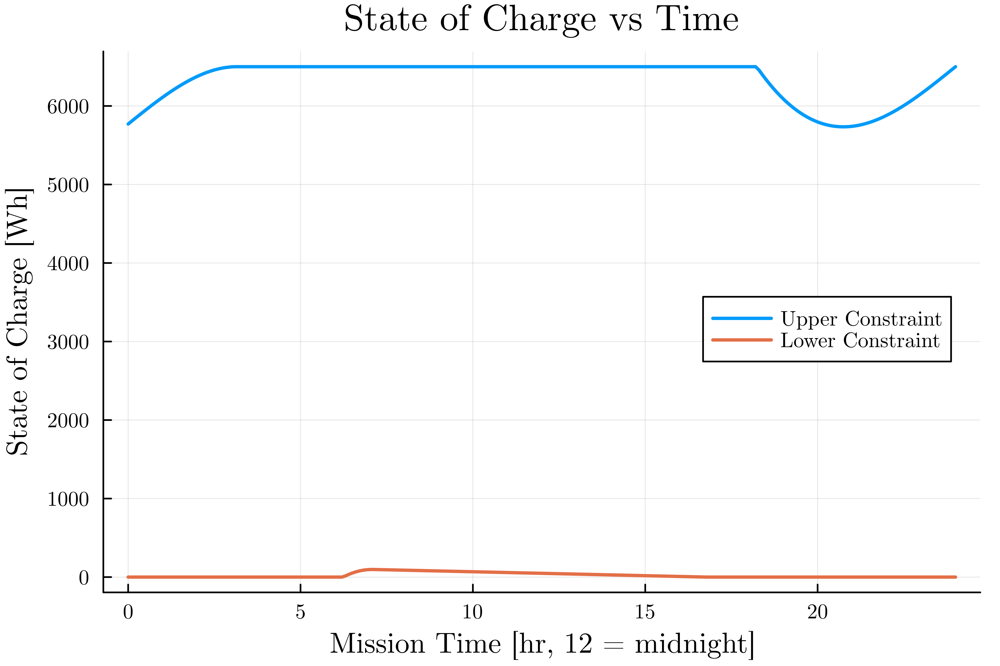

In [13]:
plot(og_time, ucbf, label="Upper Constraint");
plot!(og_time, lcbf, label="Lower Constraint");
xlabel!("Mission Time [hr, 12 = midnight]");
ylabel!("State of Charge [Wh]");
title!("State of Charge vs Time");
plot!(legend=:right, dpi=900)
savefig("fig/cbf_demo.png");
plot!()

## Combined Barrier Co-Plot

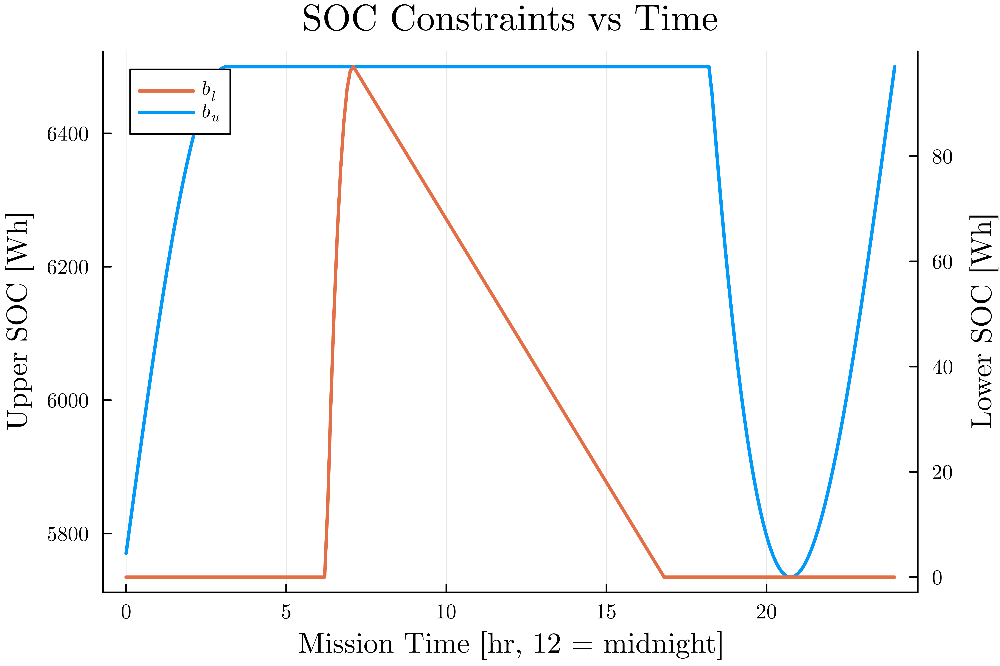

In [14]:
plot(og_time, ucbf, label=L"b_l", legend=false, color=2, ylabel="Upper SOC [Wh]");
plot!(og_time, ucbf, label=L"b_u", legend=:topleft, color=1, xlabel="Mission Time [hr, 12 = midnight]");
plot!(twinx(), og_time, lcbf, label="", color=2, ylabel="Lower SOC [Wh]");
title!("SOC Constraints vs Time");
plot!(dpi=900)
savefig("fig/soc_combined.png");
plot!()

# Combined Barrier Subplot

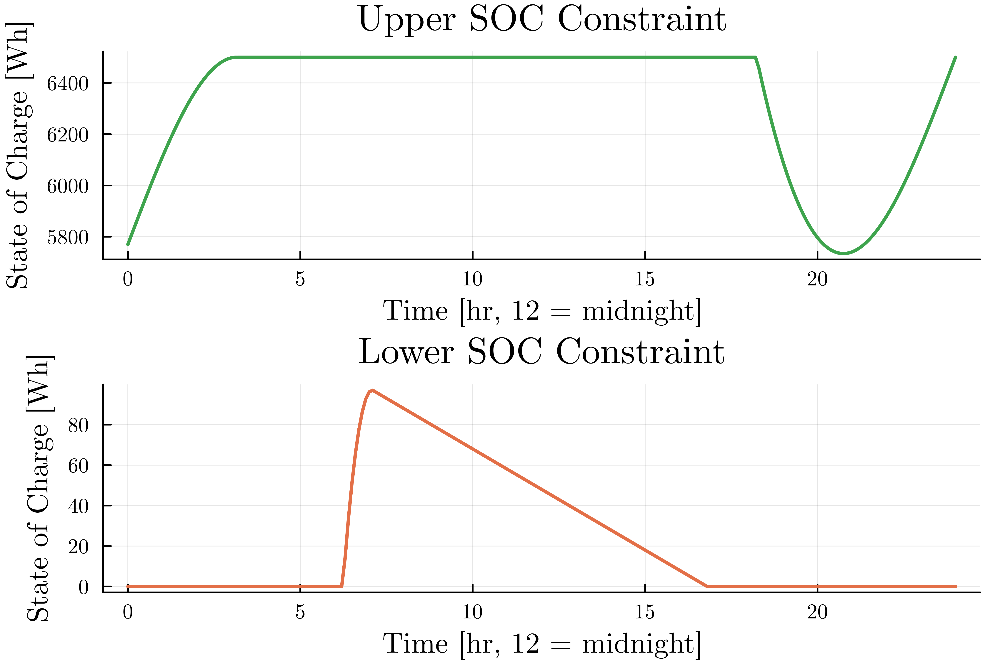

In [15]:
l = @layout[a;b]
plot(
    plot(og_time, ucbf, title="Upper SOC Constraint", color=3, lw=2),
    plot(og_time, lcbf, title="Lower SOC Constraint", color=2, lw=2),
    layout=l,
)

# plot(og_time, [ucbf, lcbf], layout=(2,1), label=false, title=["Upper Constraint", "Lower Constraint"])
xlabel!("Time [hr, 12 = midnight]");
ylabel!("State of Charge [Wh]");
plot!(legend=false, dpi=900)
savefig("fig/soc_constraint_subplot.png");
plot!()

# Velocity Trajectory Optimization
## Velocity Costate
$$
u = \sqrt{\frac{-1}{3 p_2 k_m}}
$$
re-arranging for $p_2$:
$$
p_2 = \frac{-1}{3 k_m u^2}
$$

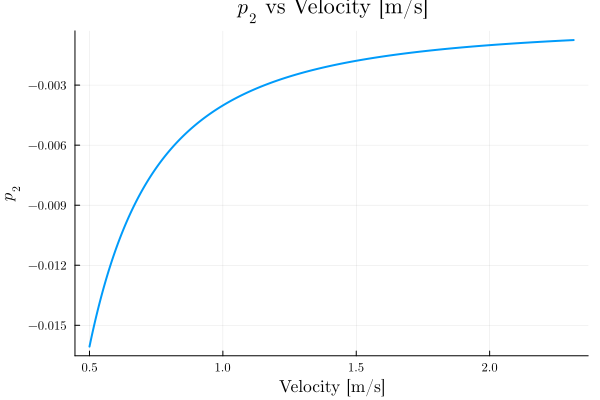

In [16]:
u = 0.5:0.001:boat.v_max;
p2_sample = -1 ./ (3 .* boat.k_m .* u.^2);
plot(u, p2_sample);
xlabel!("Velocity [m/s]");
ylabel!(L"$p_2$");
title!(L"$p_2$ vs Velocity [m/s]");
plot!(legend=false)

As seen above, this is a non-linear relationship. To make it easier to pick $p_2$, let us linearize it.

We can represent the equation for $p_2$ in the general form of the power equation
$$
\begin{align*}
y &= ax^b\\
y &= p_2\\
a &= \frac{-1}{3 k_m}\\
x &= u\\
b &= -2\\
\end{align*}
$$
The linearized form of this equation is given by:
$$
\begin{align*}
\log(y) &= b \log(x) + \log(a)
\end{align*}
$$

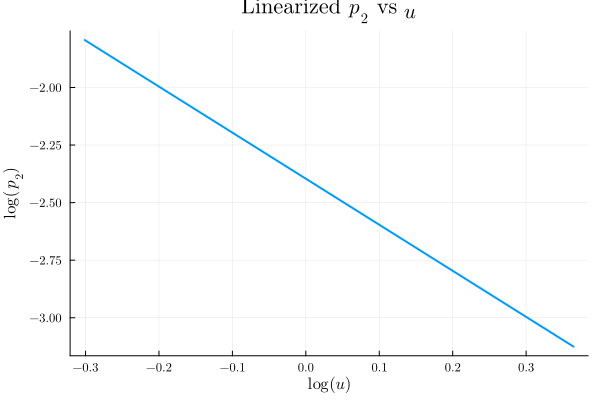

In [17]:
beta = -2;
alpha = 1/(3*boat.k_m);
p2_prime = beta .* log10.(u) .+ log10(alpha);
logp2_max = min(maximum(p2_prime), 10e4);
logp2_min = minimum(p2_prime);
plot(log10.(u), p2_prime);
xlabel!(L"$\log(u)$");
ylabel!(L"$\log(p_2)$");
title!(L"Linearized $p_2$ vs $u$");
plot!(legend=false)

## Naive Strategy - Constant Max Velocity
For this strategy, we pick $p_2$ such that the maximum velocity is selected. When the SOC intersects the CBFs, then we switch accordingly.

p2min: 0.000749374


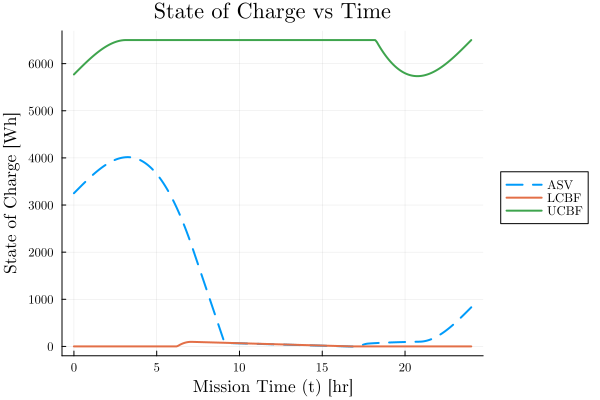

In [18]:
function batterymodel!(boat, dayOfYear, time, lat, vel, soc, dt)
    # Solar Insolation returns in kW
    p_in = max(0,SolarInsolation(dayOfYear, time, lat))* 1000 * boat.panel_area * boat.panel_efficiency;
    p_out = boat.k_h + boat.k_m * (vel^3);
    soc_est = soc + (p_in - p_out)*dt; # power update in Wh
    soc_est = min(soc_est, boat.b_max); # cap charge at soc_max
    return soc_est;
end

function powermodel!(boat, dayOfYear, time, lat, vel, soc, dt)
    # Solar Insolation returns in kW
    p_in = max(0,SolarInsolation(dayOfYear, time, lat))* 1000 * boat.panel_area * boat.panel_efficiency;
    p_out = boat.k_h + boat.k_m * (vel^3);
    out = p_in - p_out;
    return out;
end

function zeropower!(boat, dayOfYear, time, lat, soc, dt)
    p_in = max(0,SolarInsolation(dayOfYear, time, lat))* 1000 * boat.panel_area * boat.panel_efficiency;
    if p_in < boat.k_h
        vel = 0;
    else
        vel = cbrt((p_in - boat.k_h)/boat.k_m);
    end
    return vel;
end

# function velconstrained!(boat, dayOfYear, time, lat, soc, dt, lcbf_dot)
#     p_in = max(0,SolarInsolation(dayOfYear, time, lat))* 1000 * boat.panel_area * boat.panel_efficiency;
#     vel = ((p_in - boat.k_h - lcbf_dot)/boat.k_m)^1/3;
#     return max(boat.v_min, min(boat.v_max, vel));
# end

xmax = 0; # best distance travel
pstar = 0;
num_iters = 15;
p_list = zeros(num_iters);
p_list[1] = 0.5; # Initial guess for p2
p2min = 1/(3*boat.k_m*(boat.v_max^2));
println("p2min: ", p2min);

δ = 100; # 50Wh barrier on lcbf
lcbf_dot = diff(lcbf); # Derivative of lcbf

x = zeros(n);
b = ones(n)*b_0;
v = ones(n)*boat.v_max;
p2 = p2min;

for j in 2:n
    i = j-1;
    if i == 1 # initial conditions
        global x[i] = 0;
        global b[i] = b_0;
    end
    # println(p2);
    # Compute unconstrained velocity and SOC
    global v[i] = sqrt(1/(3 * p2 * boat.k_m)); # removed negative sign from numerator to let p be positive
    b_dot = powermodel!(boat, dayOfYear, t[i], lat, v[i], b[i], Δt);


    # Impose Boundary Conditions
    # v_c = velconstrained!(boat, dayOfYear, t[i], lat, b[i], Δt, lcbf_dot[i]);
    v_c = 0;
    if b[i] <= lcbf[i]
        global v[i] = 0;
    elseif 0 < (b[i] - lcbf[i]) < δ
        global v[i] = (b[i] - lcbf[i])/δ * v[i] + (1 - (b[i] - lcbf[i])/δ) * v_c;
    elseif b[i] >= ucbf[i]
        global v[i] = boat.v_max;
    end

    # Move boat
    global x[j] = x[i] + (v[i] * 60 * 60) * Δt;
    global b[j] = batterymodel!(boat, dayOfYear, t[i], lat, v[i], b[i], Δt);
end

# Plot SOC vs Time
plot(og_time, b, linestyle=:dash, label="ASV");
plot!(og_time, lcbf, label="LCBF");
plot!(og_time, ucbf, label="UCBF");
xlabel!("Mission Time (t) [hr]");
ylabel!("State of Charge [Wh]");
title!("State of Charge vs Time");
plot!(legend=:outerright)
# savefig("fig/maxvel_soc_v_time.png")


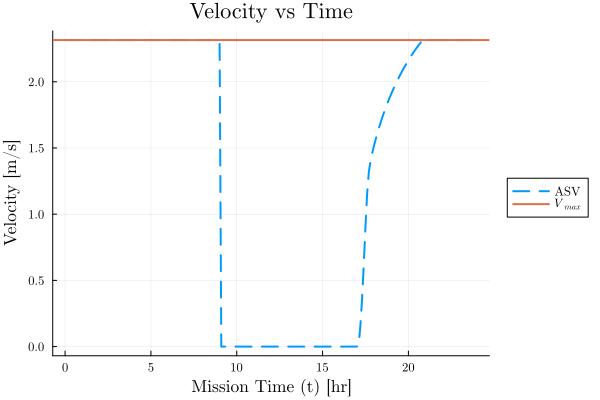

In [19]:
# Plot Velocity vs Time
plot(og_time, v, linestyle=:dash, label="ASV");
hline!([boat.v_max], label=L"$V_{max}$");
xlabel!("Mission Time (t) [hr]");
ylabel!("Velocity [m/s]");
title!("Velocity vs Time");
plot!(legend=:outerright)
# savefig("fig/maxvel_vel_v_time.png")

## Naive Strategy - Constant Min Velocity
For this strategy, we pick $p_2$ such that the minimum velocity is selected. When the SOC intersects the CBFs, then we switch accordingly.

p2min: 0.01606425702811245


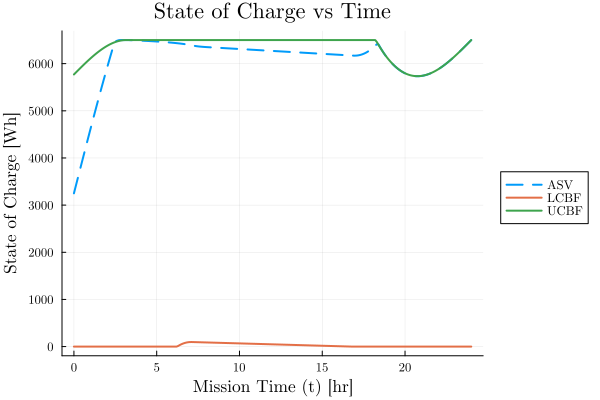

In [20]:
function batterymodel!(boat, dayOfYear, time, lat, vel, soc, dt)
    # Solar Insolation returns in kW
    p_in = max(0,SolarInsolation(dayOfYear, time, lat))* 1000 * boat.panel_area * boat.panel_efficiency;
    p_out = boat.k_h + boat.k_m * (vel^3);
    soc_est = soc + (p_in - p_out)*dt; # power update in Wh
    soc_est = min(soc_est, boat.b_max); # cap charge at soc_max
    return soc_est;
end

function powermodel!(boat, dayOfYear, time, lat, vel, soc, dt)
    # Solar Insolation returns in kW
    p_in = max(0,SolarInsolation(dayOfYear, time, lat))* 1000 * boat.panel_area * boat.panel_efficiency;
    p_out = boat.k_h + boat.k_m * (vel^3);
    out = p_in - p_out;
    return out;
end

function zeropower!(boat, dayOfYear, time, lat, soc, dt)
    p_in = max(0,SolarInsolation(dayOfYear, time, lat))* 1000 * boat.panel_area * boat.panel_efficiency;
    if p_in < boat.k_h
        vel = 0;
    else
        vel = cbrt((p_in - boat.k_h)/boat.k_m);
    end
    return vel;
end

# function velconstrained!(boat, dayOfYear, time, lat, soc, dt, lcbf_dot)
#     p_in = max(0,SolarInsolation(dayOfYear, time, lat))* 1000 * boat.panel_area * boat.panel_efficiency;
#     vel = ((p_in - boat.k_h - lcbf_dot)/boat.k_m)^1/3;
#     return max(boat.v_min, min(boat.v_max, vel));
# end

xmax = 0; # best distance travel
pstar = 0;
num_iters = 15;
p_list = zeros(num_iters);
p_list[1] = 0.5; # Initial guess for p2
p2min = 1/(3*boat.k_m*((0.5)^2));
println("p2min: ", p2min);

δ = 150; # 50Wh barrier on lcbf
lcbf_dot = diff(lcbf); # Derivative of lcbf

x = zeros(n);
b = ones(n)*b_0;
v = ones(n)*boat.v_max;
p2 = p2min;

for j in 2:n
    i = j-1;
    if i == 1 # initial conditions
        global x[i] = 0;
        global b[i] = b_0;
    end
    # println(p2);
    # Compute unconstrained velocity and SOC
    global v[i] = sqrt(1/(3 * p2 * boat.k_m)); # removed negative sign from numerator to let p be positive
    b_dot = powermodel!(boat, dayOfYear, t[i], lat, v[i], b[i], Δt);


    # Impose Boundary Conditions
    if b[i] <= lcbf[i]
        global v[i] = 0;
    elseif 0 < (b[i] - lcbf[i]) < δ
        global v[i] = (b[i] - lcbf[i])/δ * v[i] + (1 - (b[i] - lcbf[i])/δ) * boat.v_min;
    elseif b[i] >= ucbf[i]
        global v[i] = boat.v_max;
    elseif 0 < (ucbf[i] - b[i]) < δ
        global v[i] = (ucbf[i] - b[i])/δ * v[i] + (1 - (ucbf[i] - b[i])/δ) * boat.v_max;
    end

    # Move boat
    global x[j] = x[i] + (v[i] * 60 * 60) * Δt;
    global b[j] = batterymodel!(boat, dayOfYear, t[i], lat, v[i], b[i], Δt);
end

# Plot SOC vs Time
plot(og_time, b, linestyle=:dash, label="ASV");
plot!(og_time, lcbf, label="LCBF");
plot!(og_time, ucbf, label="UCBF");
xlabel!("Mission Time (t) [hr]");
ylabel!("State of Charge [Wh]");
title!("State of Charge vs Time");
plot!(legend=:outerright)
# savefig("fig/lowvel_soc_v_time.png")


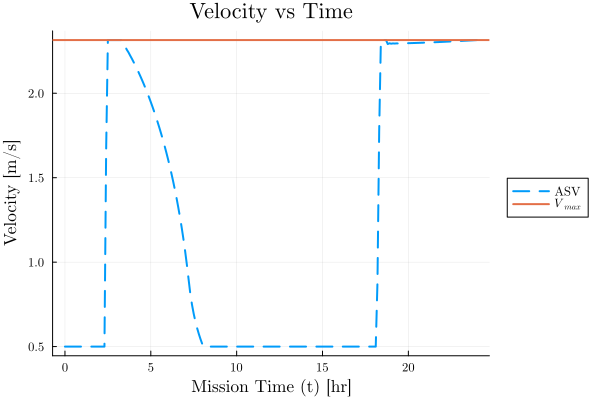

In [21]:
# Plot Velocity vs Time
plot(og_time, v, linestyle=:dash, label="ASV");
hline!([boat.v_max], label=L"$V_{max}$");
xlabel!("Mission Time (t) [hr]");
ylabel!("Velocity [m/s]");
title!("Velocity vs Time");
plot!(legend=:outerright)
# savefig("fig/lowvel_vel_v_time.png")

## Iterative Co-state Learning

p2min: 0.000749374
p2 end: 0.001100211427650696


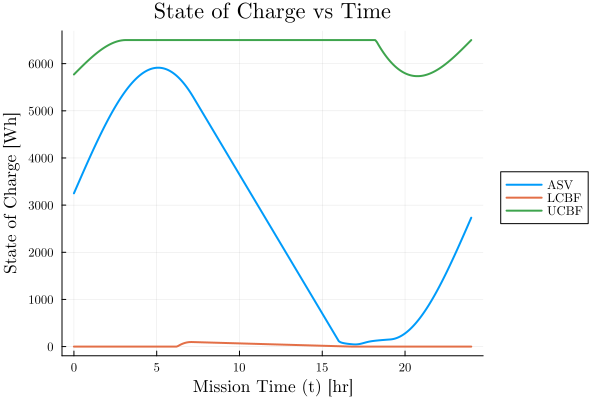

In [22]:
k_l = -1e-4; # Learning gain (-1e-5)

xmax = 0; # best distance travel
pstar = 0;
num_iters = 100;
global p_list = zeros(num_iters);
p_list[1] = 0.5; # Initial guess for p2
p2min = 1/(3*boat.k_m*(boat.v_max^2));
println("p2min: ", p2min);

x = zeros(n);
b = ones(n)*b_0;
v = ones(n)*boat.v_max;

for day = 1:1:num_iters

    global x = zeros(n);
    global b = ones(n)*b_0;
    global v = ones(n)*boat.v_max;

    p2 = p_list[day];

    for j in 2:n
        i = j-1;
        if i == 1 # initial conditions
            global x[i] = 0;
            global b[i] = b_0;
        end
        # println(p2);
        # Compute unconstrained velocity and SOC
        global v[i] = sqrt(1/(3 * p2 * boat.k_m)); # removed negative sign from numerator to let p be positive
        b_dot = powermodel!(boat, dayOfYear, t[i], lat, v[i], b[i], Δt);

        # Impose Boundary Conditions
        if b[i] <= lcbf[i]
            global v[i] = 0;
        elseif 0 < (b[i] - lcbf[i]) < δ
            global v[i] = (b[i] - lcbf[i])/δ * v[i] + (1 - (b[i] - lcbf[i])/δ) * boat.v_min;
        elseif b[i] >= ucbf[i]
            global v[i] = boat.v_max;
        elseif 0 < (ucbf[i] - b[i]) < δ
            global v[i] = (ucbf[i] - b[i])/δ * v[i] + (1 - (ucbf[i] - b[i])/δ) * boat.v_max;
        end

        # Move boat
        global x[j] = x[i] + (v[i] * 60 * 60) * Δt;
        global b[j] = batterymodel!(boat, dayOfYear, t[i], lat, v[i], b[i], Δt);
        global v[j] = v[i];
    end

    # Learning adjustment
    if day < num_iters
        pbar = log10(p_list[day]) + k_l * (b[end] - b_0);
        global p_list[day+1] = 10^pbar;
    end

    # Find optimal p2 and x
    if x[end] > xmax
        global xmax = x[end];
        global pstar = p2;
    end
end

println("p2 end: ", p_list[end]);

# Plot SOC vs Time
plot(og_time, b, label="ASV");
plot!(og_time, lcbf, label="LCBF");
plot!(og_time, ucbf, label="UCBF");
xlabel!("Mission Time (t) [hr]");
ylabel!("State of Charge [Wh]");
title!("State of Charge vs Time");
plot!(legend=:outerright)

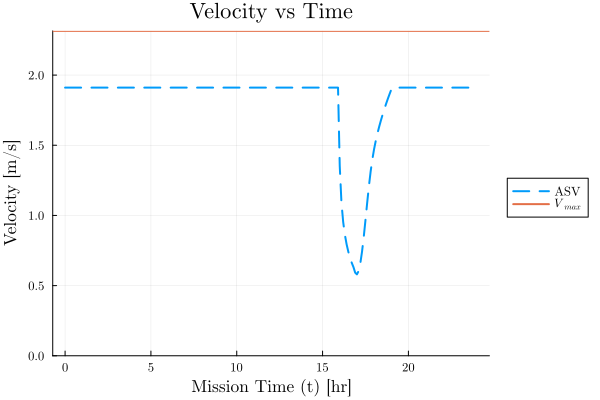

In [23]:
# Plot Velocity vs Time
plot(og_time, v, linestyle=:dash, label="ASV");
hline!([boat.v_max], label=L"$V_{max}$");
ylims!(0, boat.v_max);
xlabel!("Mission Time (t) [hr]");
ylabel!("Velocity [m/s]");
title!("Velocity vs Time");
plot!(legend=:outerright)

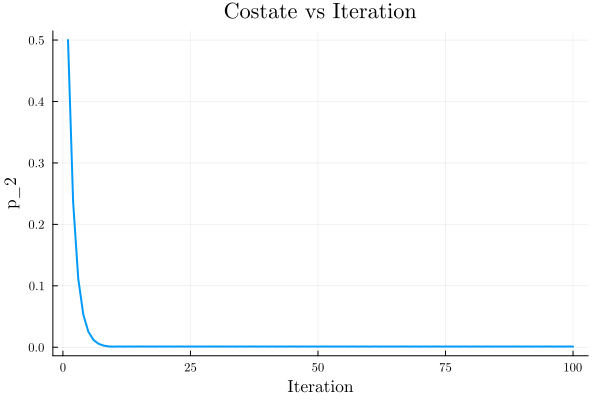

In [24]:
# Plot co-state value over time
plot(1:1:num_iters, p_list);
# ylims!(0, boat.v_max);
xlabel!("Iteration");
ylabel!("p_2");
title!("Costate vs Iteration");
plot!(legend=:false)

In [25]:
# Plot co-state value over time
plot(1:1:num_iters, log10.(p_list));
# ylims!(0, boat.v_max);
xlabel!("Iteration");
ylabel!("\$log(p_2)\$");
title!("Costate vs Iteration");
plot!(legend=:false, dpi=900)
savefig("fig/log_costate_v_iteration.png");

In [26]:
# Plot velocity vs iteration
u_list = sqrt.((3 .* p_list .* boat.k_m).^(-1));
plot(1:1:num_iters, u_list, lw=2);
xlabel!("Iteration");
ylabel!("Velocity [m/s]");
title!("Velocity vs Iteration");
ylims!(boat.v_min, boat.v_max);
plot!(legend=:false, dpi=900)
savefig("fig/velocity_v_iteration.png");

Note that we desire a quicker learning rate, ideally within a week or two. However, with the present implementation, for faster learning rates, there is an oscillation that prevents full convergence. To rectify this, we can implement essentially a PID controller. Our current learning function is a P controller. To reduce the oscillations, we will introduce damping on the rate of change of the error.

p2min: 0.000749374
p2 end: 0.0027972039024742


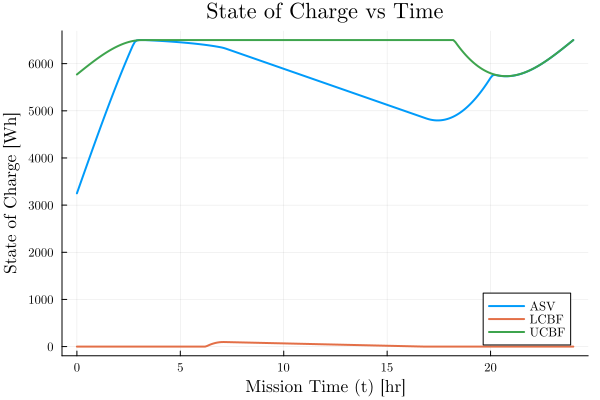

In [27]:
# k_p = -2e-4; # Learning P gain (-1e-5)
# k_d = -1e-5; # Learning D gain 9 5e-5

k_p = -7e-6;
k_d = 1e-8;

xmax = 0; # best distance travel
pstar = 0;
num_iters = 100;
global p_list = zeros(num_iters);
global error_list = zeros(num_iters);
global error_rate = zeros(num_iters);
p_list[1] = 0.5; # Initial guess for p2
p2min = 1/(3*boat.k_m*(boat.v_max^2));
println("p2min: ", p2min);

x = zeros(n);
b = ones(n)*b_0;
v = ones(n)*boat.v_max;

for day = 1:1:num_iters

    global x = zeros(n);
    global b = ones(n)*b_0;
    global v = ones(n)*boat.v_max;

    p2 = p_list[day];

    for j in 2:n
        i = j-1;
        if i == 1 # initial conditions
            global x[i] = 0;
            global b[i] = b_0;
        end
        # println(p2);
        # Compute unconstrained velocity and SOC
        global v[i] = sqrt(1/(3 * p2 * boat.k_m)); # removed negative sign from numerator to let p be positive
        b_dot = powermodel!(boat, dayOfYear, t[i], lat, v[i], b[i], Δt);

        # Impose Boundary Conditions
        if b[i] <= lcbf[i]
            global v[i] = 0;
        elseif 0 < (b[i] - lcbf[i]) < δ
            global v[i] = (b[i] - lcbf[i])/δ * v[i] + (1 - (b[i] - lcbf[i])/δ) * boat.v_min;
        elseif b[i] >= ucbf[i]
            global v[i] = boat.v_max;
        elseif 0 < (ucbf[i] - b[i]) < δ
            global v[i] = (ucbf[i] - b[i])/δ * v[i] + (1 - (ucbf[i] - b[i])/δ) * boat.v_max;
        end

        # Move boat
        global x[j] = x[i] + (v[i] * 60 * 60) * Δt;
        global b[j] = batterymodel!(boat, dayOfYear, t[i], lat, v[i], b[i], Δt);
        global v[j] = v[i];
    end

    # Learning adjustment
    if day < num_iters
        global error_rate[day] = 0;
        global error_list[day] = b[end] - b[1];
        if day != 1
            global error_rate[day] = error_list[day] - error_list[day-1];
        end
        pbar = log10(p_list[day]) + k_p * error_list[day] + k_d * error_rate[day];
        global p_list[day+1] = 10^pbar;
    end

    # Find optimal p2 and x
    if x[end] > xmax
        global xmax = x[end];
        global pstar = p2;
    end
end

println("p2 end: ", p_list[end]);

# Plot SOC vs Time
plot(og_time, b, label="ASV");
plot!(og_time, lcbf, label="LCBF");
plot!(og_time, ucbf, label="UCBF");
xlabel!("Mission Time (t) [hr]");
ylabel!("State of Charge [Wh]");
title!("State of Charge vs Time");
plot!()

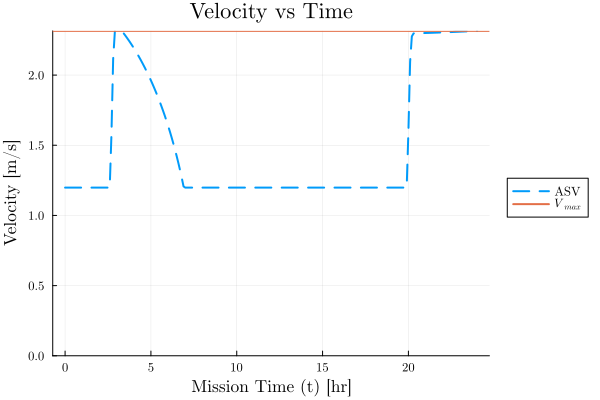

In [28]:
# Plot Velocity vs Time
plot(og_time, v, linestyle=:dash, label="ASV");
hline!([boat.v_max], label=L"$V_{max}$");
ylims!(0, boat.v_max);
xlabel!("Mission Time (t) [hr]");
ylabel!("Velocity [m/s]");
title!("Velocity vs Time");
plot!(legend=:outerright)

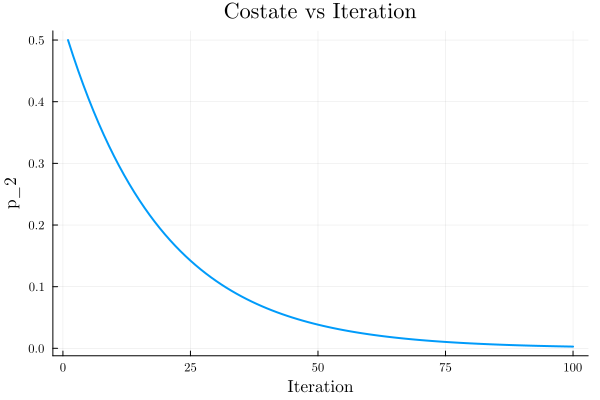

In [29]:
# Plot co-state value over time
plot(1:1:num_iters, p_list);
# ylims!(0, boat.v_max);
xlabel!("Iteration");
ylabel!("p_2");
title!("Costate vs Iteration");
plot!(legend=:false)

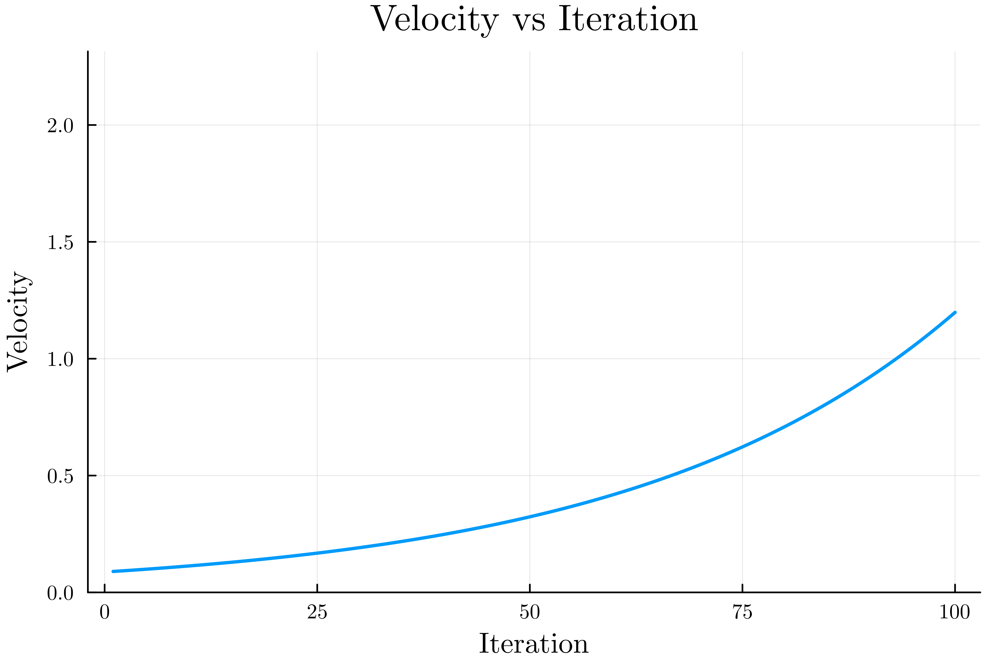

In [30]:
# Plot velocity vs iteration
u_list = sqrt.((3 .* p_list .* boat.k_m).^(-1));
plot(1:1:num_iters, u_list);
xlabel!("Iteration");
ylabel!("Velocity");
title!("Velocity vs Iteration");
ylims!(boat.v_min, boat.v_max);
plot!(legend=:false, dpi=900)

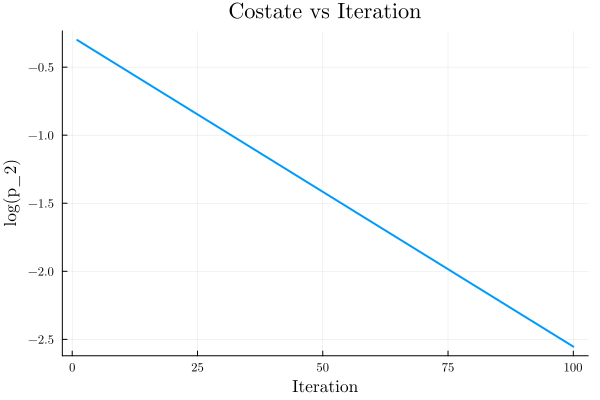

In [31]:
# Plot co-state value over time
plot(1:1:num_iters, log10.(p_list));
# ylims!(0, boat.v_max);
xlabel!("Iteration");
ylabel!("log(p_2)");
title!("Costate vs Iteration");
plot!(legend=:false)

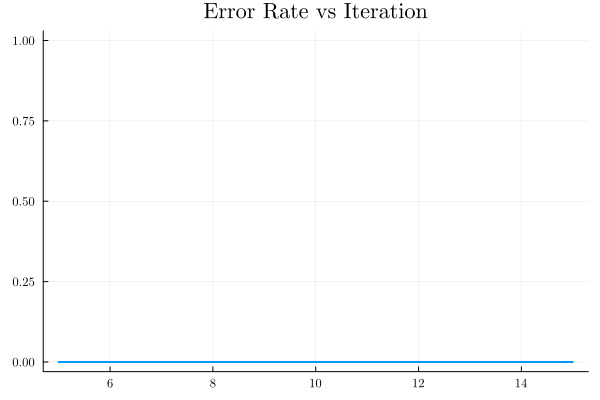

In [32]:
plot(5:15, error_rate[5:15]);
title!("Error Rate vs Iteration");
plot!(legend=false)

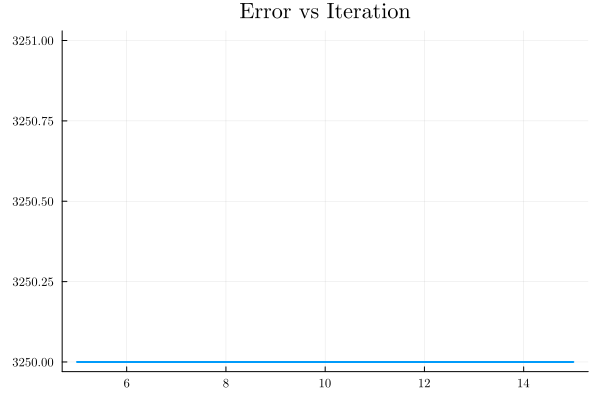

In [33]:
plot(5:15, error_list[5:15]);
title!("Error vs Iteration");
plot!(legend=false)